# Escopo do Projeto Individual

Nivel Infra
O Dataset deve ser salvo em ambiente cloud(Cloud Storage)
O arquivo original e tratado deve ser salvo em MongoDB Atlas em coleções diferentes
Os DataFrames devem ser obrigatoriamente salvos em uma bucket do CloudStorage

Nivel Pandas
O arquivo está em outra linguagem e deve ter seus dados traduzidos para Português-BR
Realizar a extração corretamente para um dataframe
Verificar a existência de dados inconsistentes e realizar a limpeza para NaN ou NA
Realizar o drop(se necessário) de colunas do dataframe realizando o comentário do porque da exclusão 
Todos os passos devem ser comentados

Nivel PySpark (Funções básicas vistas em aula)
Deverá ser montada a estrutura do DataFrame utilizando o StructType.
Verificar a existência de dados inconsistentes, nulos e realizar a limpeza.
Verificar a necessidade de drop em colunas ou linhas. Caso seja necessário, fazer comentário do porque.
Realizar a mudança de nome de pelo menos 2 colunas
Deverá criar pelo menos duas novas colunas contendo alguma informação relevante sobre as outras colunas já existentes (Funções de Agrupamento, Agregação ou Joins). (Use a sua capacidade analítica)
Deverá utilizar filtros, ordenação e agrupamento, trazendo dados relevantes para o negócio em questão. (Use a sua capacidade analítica)
Utilizar pelo menos duas Window Functions

Nivel SparkSQL
Utilizar no minimo 5 consultas diferentes utilizando o SparkSQL, comentando o porquê de ter escolhido essas funções e explicando o que cada consulta faz.

Nível DataStudio
Construir um dashboard (maximo 1 pagina) para apresentação dos insights

Ferramentas


Colab ou Ides | Google Cloud | Data Studio


Observação : o que será analisado são os tópicos cumpridos , na ocasião de findar o tempo e algum(ns) não forem contemplados , realize a entrega do que foi concluído . Pedimos que nos conceda acesso ao email professores.bcw4@soulcodeacademy.org e professoresbc17@soulcodeacademy.org para seu projeto no google cloud , adicione um usuário : soulcode senha : a1b2c3 no mongo atlas e compartilhe junto a key de autenticação para acessarmos seu mongo atlas e seja enviado juntamente com o codigo realizado

# Instalações e Importações

Importação da biblioteca pandas para trabalho com dataframes

In [7]:
import pandas as pd

Importação da biblioteca numpy

In [8]:
import numpy as np

# Nível Infra

# Conexão com o GCS

Instalação do gcsfs para habilitar conexão com o Google Cloud Storage

In [ ]:
!pip install gcsfs

Importação das bibliotecas storage e os para conexão com o Google Cloud Storage

In [9]:
from google.cloud import storage
import os

Configuração e validação da chave de segurança

In [10]:
serviceAccount = "C:\\Users\\Diego\\Downloads\\friendly-lamp-349020-bdf0e3fd5a08.json"
os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = serviceAccount

Acessando a bucket

In [11]:
client = storage.Client()

Criando a variável para a bucket

In [12]:
bucket = client.get_bucket('teste_bucket_soulcode')

Caminho para acesso ao arquivo com gsutil

In [13]:
path = 'gs://teste_bucket_soulcode/originais/marketing_campaign - marketing_campaign.csv'

# Criação da database

## Nivel Pandas

Carregando a dataframe na variável df

In [14]:
df = pd.read_csv(path, sep=';')

Obtendo um overview da dataframe

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [12]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,...,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,...,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,...,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,...,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,...,3,0,0,0,0,0,0,3,11,0


Modificando o limite de exibição de colunas e linhas

In [13]:
pd.options.display.max_columns = False
pd.options.display.max_rows = False

In [14]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0
5,7446,1967,Master,Together,62513.0,0,1,2013-09-09,16,520,42,98,0,42,14,2,6,4,10,6,0,0,0,0,0,0,3,11,0
6,965,1971,Graduation,Divorced,55635.0,0,1,2012-11-13,34,235,65,164,50,49,27,4,7,3,7,6,0,0,0,0,0,0,3,11,0
7,6177,1985,PhD,Married,33454.0,1,0,2013-05-08,32,76,10,56,3,1,23,2,4,0,4,8,0,0,0,0,0,0,3,11,0
8,4855,1974,PhD,Together,30351.0,1,0,2013-06-06,19,14,0,24,3,3,2,1,3,0,2,9,0,0,0,0,0,0,3,11,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...


Verificando valores nulos na df

In [15]:
df.isna().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
                       ..
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
Length: 29, dtype: int64

In [16]:
filtro1 = df['Income'].isna()
df.loc[filtro1]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
10,1994,1983,Graduation,Married,NaN,1,0,2013-11-15,11,5,5,6,0,2,1,1,1,0,2,7,0,0,0,0,0,0,3,11,0
27,5255,1986,Graduation,Single,NaN,1,0,2013-02-20,19,5,1,3,3,263,362,0,27,0,0,1,0,0,0,0,0,0,3,11,0
43,7281,1959,PhD,Single,NaN,0,0,2013-11-05,80,81,11,50,3,2,39,1,1,3,4,2,0,0,0,0,0,0,3,11,0
48,7244,1951,Graduation,Single,NaN,2,1,2014-01-01,96,48,5,48,6,10,7,3,2,1,4,6,0,0,0,0,0,0,3,11,0
58,8557,1982,Graduation,Single,NaN,1,0,2013-06-17,57,11,3,22,2,2,6,2,2,0,3,6,0,0,0,0,0,0,3,11,0
71,10629,1973,2n Cycle,Married,NaN,1,0,2012-09-14,25,25,3,43,17,4,17,3,3,0,3,8,0,0,0,0,0,0,3,11,0
90,8996,1957,PhD,Married,NaN,2,1,2012-11-19,4,230,42,192,49,37,53,12,7,2,8,9,0,0,0,0,0,0,3,11,0
91,9235,1957,Graduation,Single,NaN,1,1,2014-05-27,45,7,0,8,2,0,1,1,1,0,2,7,0,0,0,0,0,0,3,11,0
92,5798,1973,Master,Together,NaN,0,0,2013-11-23,87,445,37,359,98,28,18,1,2,4,8,1,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...


Retirando valores nulos pois não tinham representatividade considerável na df

In [9]:
df = df.dropna()

In [18]:
df.isna().sum()

ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
                      ..
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Z_CostContact          0
Z_Revenue              0
Response               0
Length: 29, dtype: int64

Verificando valores das colunas 'Z_Revenue','Z_CostContact'

In [19]:
np.unique(df[['Z_Revenue','Z_CostContact']], axis=0)

array([[11,  3]], dtype=int64)

Dropando ambas as colunas pois não agregavam informação na df

In [10]:
df = df.drop(columns=['Z_Revenue','Z_CostContact'])

In [21]:
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0


In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2216 entries, 0 to 2239
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2216 non-null   int64  
 1   Year_Birth           2216 non-null   int64  
 2   Education            2216 non-null   object 
 3   Marital_Status       2216 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2216 non-null   int64  
 6   Teenhome             2216 non-null   int64  
 7   Dt_Customer          2216 non-null   object 
 8   Recency              2216 non-null   int64  
 9   MntWines             2216 non-null   int64  
 10  MntFruits            2216 non-null   int64  
 11  MntMeatProducts      2216 non-null   int64  
 12  MntFishProducts      2216 non-null   int64  
 13  MntSweetProducts     2216 non-null   int64  
 14  MntGoldProds         2216 non-null   int64  
 15  NumDealsPurchases    2216 non-null   i

Verificando se existem IDs repetidos

In [23]:
np.unique(df['ID']).shape

(2216,)

Tranformando a coluna 'Dt_Customer' para formato datetime

In [11]:
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'])

Exibindo a coluna de data no formato brasileiro

In [ ]:
df.style.format({"Dt_Customer": lambda t: t.strftime("%d/%m/%Y")})

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2216 entries, 0 to 2239
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2216 non-null   int64         
 1   Year_Birth           2216 non-null   int64         
 2   Education            2216 non-null   object        
 3   Marital_Status       2216 non-null   object        
 4   Income               2216 non-null   float64       
 5   Kidhome              2216 non-null   int64         
 6   Teenhome             2216 non-null   int64         
 7   Dt_Customer          2216 non-null   datetime64[ns]
 8   Recency              2216 non-null   int64         
 9   MntWines             2216 non-null   int64         
 10  MntFruits            2216 non-null   int64         
 11  MntMeatProducts      2216 non-null   int64         
 12  MntFishProducts      2216 non-null   int64         
 13  MntSweetProducts     2216 non-nul

Renomeando todas as colunas do dataframe para o português

In [12]:
df.rename(columns= {
    'Year_Birth':'ano_nascimento',
    'Education':'grau_educacional',
    'Marital_Status':'estado_civil',
    'Income':'renda_anual',
    'Kidhome':'qtd_criancas',
    'Teenhome':'qtd_adolescentes',
    'Dt_Customer':'data_cadastro_cliente',
    'Recency':'dias_desde_ultima_compra',
    'MntWines':'valor_gasto_vinhos',
    'MntFruits':'valor_gasto_frutas',
    'MntMeatProducts':'valor_gasto_carnes',
    'MntFishProducts':'valor_gasto_peixes',
    'MntSweetProducts':'valor_gasto_doces',
    'MntGoldProds':'valor_gasto_ouro',
    'NumDealsPurchases':'qtd_compras_com_desconto',
    'NumWebPurchases':'qtd_compras_digital',
    'NumCatalogPurchases':'qtd_compras_catalogo',
    'NumStorePurchases':'qtd_compras_fisica',
    'NumWebVisitsMonth':'qtd_visitas_site',
    'AcceptedCmp1':'comprou_na_campanha_1',
    'AcceptedCmp2':'comprou_na_campanha_2',
    'AcceptedCmp3':'comprou_na_campanha_3',
    'AcceptedCmp4':'comprou_na_campanha_4',
    'AcceptedCmp5':'comprou_na_campanha_5',
    'Complain':'realizou_reclamacao',
    'Response':'comprou_na_ultima_campanha'
}, inplace = True)

In [28]:
df.head()

,ID,ano_nascimento,grau_educacional,estado_civil,renda_anual,qtd_criancas,qtd_adolescentes,data_cadastro_cliente,dias_desde_ultima_compra,valor_gasto_vinhos,valor_gasto_frutas,valor_gasto_carnes,valor_gasto_peixes,valor_gasto_doces,valor_gasto_ouro,qtd_compras_com_desconto,qtd_compras_digital,qtd_compras_catalogo,qtd_compras_fisica,qtd_visitas_site,comprou_na_campanha_3,comprou_na_campanha_4,comprou_na_campanha_5,comprou_na_campanha_1,comprou_na_campanha_2,realizou_reclamacao,comprou_na_ultima_campanha
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0


Traduzindo as informações da coluna 'grau_educacional' para o português

In [29]:
df.grau_educacional.unique()

array(['Graduation', 'PhD', 'Master', 'Basic', '2n Cycle'], dtype=object)

In [13]:
df.replace({
    'Graduation':'Superior',
    'Master':'Mestre',
    'Basic':'Básico',
    '2n Cycle':'2º Ciclo'
}, inplace=True)

Traduzindo as informações da coluna 'estado_civil' para o português

In [31]:
df.estado_civil.unique()

array(['Single', 'Together', 'Married', 'Divorced', 'Widow', 'Alone',
       'Absurd', 'YOLO'], dtype=object)

In [14]:
df.replace({
    'Single':'Solteiro',
    'Together':'Junto',
    'Married':'Amasiado',
    'Divorced':'Divorciado',
    'Widow':'Viúvo',
    'Alone':'Solteiro',
    'Absurd':'Absurd',
    'YOLO':'YOLO'
}, inplace=True)

Verificando resultados fora do padrão

In [33]:
filtro2 = df['estado_civil'] == 'Absurd'

In [34]:
df.loc[filtro2]

,ID,ano_nascimento,grau_educacional,estado_civil,renda_anual,qtd_criancas,qtd_adolescentes,data_cadastro_cliente,dias_desde_ultima_compra,valor_gasto_vinhos,valor_gasto_frutas,valor_gasto_carnes,valor_gasto_peixes,valor_gasto_doces,valor_gasto_ouro,qtd_compras_com_desconto,qtd_compras_digital,qtd_compras_catalogo,qtd_compras_fisica,qtd_visitas_site,comprou_na_campanha_3,comprou_na_campanha_4,comprou_na_campanha_5,comprou_na_campanha_1,comprou_na_campanha_2,realizou_reclamacao,comprou_na_ultima_campanha
2093,7734,1993,Superior,Absurd,79244.0,0,0,2012-12-19,58,471,102,125,212,61,245,1,4,10,7,1,0,0,1,1,0,0,1
2134,4369,1957,Mestre,Absurd,65487.0,0,0,2014-01-10,48,240,67,500,199,0,163,3,3,5,6,2,0,0,0,0,0,0,0


In [35]:
filtro3 = df['estado_civil'] == 'YOLO'

In [36]:
df.loc[filtro3]

,ID,ano_nascimento,grau_educacional,estado_civil,renda_anual,qtd_criancas,qtd_adolescentes,data_cadastro_cliente,dias_desde_ultima_compra,valor_gasto_vinhos,valor_gasto_frutas,valor_gasto_carnes,valor_gasto_peixes,valor_gasto_doces,valor_gasto_ouro,qtd_compras_com_desconto,qtd_compras_digital,qtd_compras_catalogo,qtd_compras_fisica,qtd_visitas_site,comprou_na_campanha_3,comprou_na_campanha_4,comprou_na_campanha_5,comprou_na_campanha_1,comprou_na_campanha_2,realizou_reclamacao,comprou_na_ultima_campanha
2177,492,1973,PhD,YOLO,48432.0,0,1,2012-10-18,3,322,3,50,4,3,42,5,7,1,6,8,0,0,0,0,0,0,0
2202,11133,1973,PhD,YOLO,48432.0,0,1,2012-10-18,3,322,3,50,4,3,42,5,7,1,6,8,0,0,0,0,0,0,1


Dropando valores fora do padrão

In [15]:
df.drop([2093,2134,2177,2202], inplace=True)

In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2212 entries, 0 to 2239
Data columns (total 27 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   ID                          2212 non-null   int64         
 1   ano_nascimento              2212 non-null   int64         
 2   grau_educacional            2212 non-null   object        
 3   estado_civil                2212 non-null   object        
 4   renda_anual                 2212 non-null   float64       
 5   qtd_criancas                2212 non-null   int64         
 6   qtd_adolescentes            2212 non-null   int64         
 7   data_cadastro_cliente       2212 non-null   datetime64[ns]
 8   dias_desde_ultima_compra    2212 non-null   int64         
 9   valor_gasto_vinhos          2212 non-null   int64         
 10  valor_gasto_frutas          2212 non-null   int64         
 11  valor_gasto_carnes          2212 non-null   int64       

Verificando valores na dataframe

In [39]:
df.renda_anual.unique()

array([58138., 46344., 71613., ..., 56981., 69245., 52869.])

In [40]:
df.qtd_criancas.unique()

array([0, 1, 2], dtype=int64)

In [41]:
df.qtd_adolescentes.unique()

array([0, 1, 2], dtype=int64)

In [ ]:
df.data_cadastro_cliente.unique()

In [43]:
df.dias_desde_ultima_compra.unique()

array([58, 38, 26, 94, 16, 34, 32, 19, 68, 59, 82, 53, 23, 51, 20, 91, 86,
       41, 42, 63,  0, 69, 89,  4, 96, 56, 31,  8, 55, 37, 76, 99,  3, 88,
       72, 24, 92, 39, 29,  2, 54, 57, 30, 12, 18, 75, 90,  1, 40,  9, 87,
        5, 95, 48, 70, 79, 84, 44, 43, 35, 15, 17, 46, 27, 25, 74, 85, 65,
       13, 83, 10, 21, 61, 73, 47, 36, 49, 28, 64, 98, 78, 77, 81, 80, 45,
       14, 52, 93, 50, 60, 11, 66, 97, 62,  6, 33, 22, 71, 67,  7],
      dtype=int64)

In [ ]:
df.valor_gasto_vinhos.unique()

Transformando as colunas de resposta para tipos booleanos

In [16]:
df[['comprou_na_campanha_1', 'comprou_na_campanha_2', 'comprou_na_campanha_3', 'comprou_na_campanha_4', 'comprou_na_campanha_5', 'realizou_reclamacao', 'comprou_na_ultima_campanha']] = df[['comprou_na_campanha_1', 'comprou_na_campanha_2', 'comprou_na_campanha_3', 'comprou_na_campanha_4', 'comprou_na_campanha_5', 'realizou_reclamacao', 'comprou_na_ultima_campanha']].replace({
    0:False,
    1:True
}).astype('bool')

In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2212 entries, 0 to 2239
Data columns (total 27 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   ID                          2212 non-null   int64         
 1   ano_nascimento              2212 non-null   int64         
 2   grau_educacional            2212 non-null   object        
 3   estado_civil                2212 non-null   object        
 4   renda_anual                 2212 non-null   float64       
 5   qtd_criancas                2212 non-null   int64         
 6   qtd_adolescentes            2212 non-null   int64         
 7   data_cadastro_cliente       2212 non-null   datetime64[ns]
 8   dias_desde_ultima_compra    2212 non-null   int64         
 9   valor_gasto_vinhos          2212 non-null   int64         
 10  valor_gasto_frutas          2212 non-null   int64         
 11  valor_gasto_carnes          2212 non-null   int64       

Reorganizando a ordem das colunas na dataframe

In [17]:
df = df.reindex(columns=['ID','ano_nascimento', 'grau_educacional','estado_civil','renda_anual','qtd_criancas', 'qtd_adolescentes','data_cadastro_cliente','dias_desde_ultima_compra','valor_gasto_vinhos', 'valor_gasto_frutas','valor_gasto_carnes','valor_gasto_peixes','valor_gasto_doces', 'valor_gasto_ouro','qtd_compras_com_desconto','qtd_compras_digital', 'qtd_compras_catalogo','qtd_compras_fisica','qtd_visitas_site', 'realizou_reclamacao','comprou_na_campanha_1','comprou_na_campanha_2', 'comprou_na_campanha_3','comprou_na_campanha_4','comprou_na_campanha_5','comprou_na_ultima_campanha'])

In [48]:
df.head()

,ID,ano_nascimento,grau_educacional,estado_civil,renda_anual,qtd_criancas,qtd_adolescentes,data_cadastro_cliente,dias_desde_ultima_compra,valor_gasto_vinhos,valor_gasto_frutas,valor_gasto_carnes,valor_gasto_peixes,valor_gasto_doces,valor_gasto_ouro,qtd_compras_com_desconto,qtd_compras_digital,qtd_compras_catalogo,qtd_compras_fisica,qtd_visitas_site,realizou_reclamacao,comprou_na_campanha_1,comprou_na_campanha_2,comprou_na_campanha_3,comprou_na_campanha_4,comprou_na_campanha_5,comprou_na_ultima_campanha
0,5524,1957,Superior,Solteiro,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,False,False,False,False,False,False,True
1,2174,1954,Superior,Solteiro,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,False,False,False,False,False,False,False
2,4141,1965,Superior,Junto,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,False,False,False,False,False,False,False
3,6182,1984,Superior,Junto,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,False,False,False,False,False,False,False
4,5324,1981,PhD,Amasiado,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,False,False,False,False,False,False,False


Exportando a dataframe para o GCS

In [49]:
df.to_csv('gs://teste_bucket_soulcode/tratados/marketing_campaign_tratado_pandas.csv', index=False)

## Nivel PySpark

In [50]:
!pip install pyspark

In [1]:
from pyspark.sql import SparkSession
from pyspark import SparkConf
import pyspark.sql.functions as F
from pyspark.sql.types import *
from pyspark.sql.window import Window
import os

Fazendo a conexão com o SparkSession

In [2]:
spark = (SparkSession.builder
               .master("local")
               .appName('aula-inicial')
               .config('spark.ui.port', '4050')
               .getOrCreate()
        )

Verificando a conexão

In [3]:
spark

Definindo o esquema da dataframe

In [54]:
esquema = (
    StructType([
                StructField('ID', StringType(), True),
                StructField('ano_nascimento', IntegerType(), True),
                StructField('grau_educacional', StringType(), True),
                StructField('estado_civil', StringType(), True),
                StructField('renda_anual', FloatType(), True),
                StructField('qtd_criancas', IntegerType(), True),
                StructField('qtd_adolescentes', IntegerType(), True),
                StructField('data_cadastro_cliente', DateType(), True),
                StructField('dias_desde_ultima_compra', IntegerType(), True),
                StructField('valor_gasto_vinhos', IntegerType(), True),
                StructField('valor_gasto_frutas', IntegerType(), True),
                StructField('valor_gasto_carnes', IntegerType(), True),
                StructField('valor_gasto_peixes', IntegerType(), True),
                StructField('valor_gasto_doces', IntegerType(), True),
                StructField('valor_gasto_ouro', IntegerType(), True),
                StructField('qtd_compras_com_desconto', IntegerType(), True),
                StructField('qtd_compras_digital', IntegerType(), True),
                StructField('qtd_compras_catalogo', IntegerType(), True),
                StructField('qtd_compras_fisica', IntegerType(), True),
                StructField('qtd_visitas_site', IntegerType(), True),
                StructField('comprou_na_campanha_1', BooleanType(), True),
                StructField('comprou_na_campanha_2', BooleanType(), True),
                StructField('comprou_na_campanha_3', BooleanType(), True),
                StructField('comprou_na_campanha_4', BooleanType(), True),
                StructField('comprou_na_campanha_5', BooleanType(), True),
                StructField('realizou_reclamacao', BooleanType(), True),
                StructField('comprou_na_ultima_campanha', BooleanType(), True)
        
    ])
)

Carrendo a dataframe

In [55]:
df = (
    spark.read.format('csv')
              .option('header', 'true')
              .option('delimiter', ',')
              .option('inferschema', 'true')
              .load('C:\\Users\\Diego\\Documents\\Jupyter\\datas\\tratados_marketing_campaign_tratado_pandas.csv', schema=esquema)
)

In [56]:
df.show(1)

+----+--------------+----------------+------------+-----------+------------+----------------+---------------------+------------------------+------------------+------------------+------------------+------------------+-----------------+----------------+------------------------+-------------------+--------------------+------------------+----------------+---------------------+---------------------+---------------------+---------------------+---------------------+-------------------+--------------------------+
|  ID|ano_nascimento|grau_educacional|estado_civil|renda_anual|qtd_criancas|qtd_adolescentes|data_cadastro_cliente|dias_desde_ultima_compra|valor_gasto_vinhos|valor_gasto_frutas|valor_gasto_carnes|valor_gasto_peixes|valor_gasto_doces|valor_gasto_ouro|qtd_compras_com_desconto|qtd_compras_digital|qtd_compras_catalogo|qtd_compras_fisica|qtd_visitas_site|comprou_na_campanha_1|comprou_na_campanha_2|comprou_na_campanha_3|comprou_na_campanha_4|comprou_na_campanha_5|realizou_reclamacao|compro

## Criando duas novas colunas:

## Uma para somar o valor total gasto na empresa,
## outra pra mostrar quantos meses esse cliente está cadastrado.

In [57]:
df = df.withColumn('coluna_nova_1', F.col('valor_gasto_vinhos') + F.col('valor_gasto_frutas') + F.col('valor_gasto_carnes') + F.col('valor_gasto_peixes') + F.col('valor_gasto_doces') + F.col('valor_gasto_ouro'))

In [58]:
from pyspark.sql.functions import months_between,col

In [59]:
df = df.withColumn('coluna_nova_2', months_between(F.current_date(), F.col("data_cadastro_cliente")))

## Tratando a data para o formato brasileiro.

In [60]:
df = df.withColumn('data_cadastro_cliente', F.date_format(F.col('data_cadastro_cliente'), 'dd/MM/yyyy').alias('Data_BR'))

In [61]:
df.head(1)

[Row(ID='5524', ano_nascimento=1957, grau_educacional='Superior', estado_civil='Solteiro', renda_anual=58138.0, qtd_criancas=0, qtd_adolescentes=0, data_cadastro_cliente='04/09/2012', dias_desde_ultima_compra=58, valor_gasto_vinhos=635, valor_gasto_frutas=88, valor_gasto_carnes=546, valor_gasto_peixes=172, valor_gasto_doces=88, valor_gasto_ouro=88, qtd_compras_com_desconto=3, qtd_compras_digital=8, qtd_compras_catalogo=10, qtd_compras_fisica=4, qtd_visitas_site=7, comprou_na_campanha_1=False, comprou_na_campanha_2=False, comprou_na_campanha_3=False, comprou_na_campanha_4=False, comprou_na_campanha_5=False, realizou_reclamacao=False, comprou_na_ultima_campanha=True, coluna_nova_1=1617, coluna_nova_2=116.87096774)]

## Renomeando as colunas criadas anteriormente

In [62]:
#COMANDO PARA RENOMEAR COLUNAS
df = df.withColumnRenamed("coluna_nova_1", "valor_gasto_total")

In [63]:
df = df.withColumnRenamed("coluna_nova_2", "meses_cadastrado")

In [64]:
df.show(1)

+----+--------------+----------------+------------+-----------+------------+----------------+---------------------+------------------------+------------------+------------------+------------------+------------------+-----------------+----------------+------------------------+-------------------+--------------------+------------------+----------------+---------------------+---------------------+---------------------+---------------------+---------------------+-------------------+--------------------------+-----------------+----------------+
|  ID|ano_nascimento|grau_educacional|estado_civil|renda_anual|qtd_criancas|qtd_adolescentes|data_cadastro_cliente|dias_desde_ultima_compra|valor_gasto_vinhos|valor_gasto_frutas|valor_gasto_carnes|valor_gasto_peixes|valor_gasto_doces|valor_gasto_ouro|qtd_compras_com_desconto|qtd_compras_digital|qtd_compras_catalogo|qtd_compras_fisica|qtd_visitas_site|comprou_na_campanha_1|comprou_na_campanha_2|comprou_na_campanha_3|comprou_na_campanha_4|comprou_na_ca

In [65]:
lista_1 = ['valor_gasto_total', 'meses_cadastrado']

In [66]:
df.select(lista_1).sort(F.col('valor_gasto_total').desc()).show()
df.select(lista_1).sort(F.col('meses_cadastrado').desc()).show()

+-----------------+----------------+
|valor_gasto_total|meses_cadastrado|
+-----------------+----------------+
|             2525|     99.58064516|
|             2525|     99.58064516|
|             2524|    106.12903226|
|             2486|    103.19354839|
|             2440|    111.48387097|
|             2352|    116.16129032|
|             2349|     99.61290323|
|             2346|    111.67741935|
|             2302|    110.87096774|
|             2302|    110.87096774|
|             2283|    104.12903226|
|             2279|    105.48387097|
|             2257|     98.67741935|
|             2252|    110.67741935|
|             2231|    110.90322581|
|             2217|     103.4516129|
|             2211|     99.61290323|
|             2209|    115.61290323|
|             2194|    117.19354839|
|             2157|      95.4516129|
+-----------------+----------------+
only showing top 20 rows

+-----------------+----------------+
|valor_gasto_total|meses_cadastrado|
+-----------

In [67]:
df.groupBy(F.col('estado_civil')).count().show()

+------------+-----+
|estado_civil|count|
+------------+-----+
|       Viúvo|   76|
|  Divorciado|  232|
|    Solteiro|  474|
|       Junto|  573|
|    Amasiado|  857|
+------------+-----+



In [68]:
df.groupBy(F.col('estado_civil')).mean('valor_gasto_total').show()

+------------+----------------------+
|estado_civil|avg(valor_gasto_total)|
+------------+----------------------+
|       Viúvo|     727.9605263157895|
|  Divorciado|     610.6293103448276|
|    Solteiro|     610.3396624472574|
|       Junto|     608.8464223385689|
|    Amasiado|     591.4644107351226|
+------------+----------------------+



## Window Functions:

In [69]:
w0 = Window.partitionBy(F.col('ano_nascimento')).orderBy('renda_anual')

In [70]:
lista_2 = ['ano_nascimento','renda_anual', 'dias_desde_ultima_compra', 'qtd_compras_digital', 'qtd_compras_catalogo', 'qtd_compras_fisica']

In [71]:
df_filtro = df.select(lista_2)

In [72]:
df_filtro.withColumn('rank', F.rank().over(w0)).show()

+--------------+-----------+------------------------+-------------------+--------------------+------------------+----+
|ano_nascimento|renda_anual|dias_desde_ultima_compra|qtd_compras_digital|qtd_compras_catalogo|qtd_compras_fisica|rank|
+--------------+-----------+------------------------+-------------------+--------------------+------------------+----+
|          1893|    60182.0|                      23|                  1|                   0|                 2|   1|
|          1899|    83532.0|                      36|                  4|                   6|                 4|   1|
|          1900|    36640.0|                      99|                  2|                   1|                 2|   1|
|          1940|    51141.0|                      96|                  3|                   1|                 4|   1|
|          1941|    93027.0|                      77|                  7|                  10|                 5|   1|
|          1943|    48948.0|                    

In [73]:
w1 = Window.partitionBy(F.col('dias_desde_ultima_compra')).orderBy('qtd_compras_digital')

In [74]:
df_filtro.withColumn('row_number', F.row_number().over(w1)).show()

+--------------+-----------+------------------------+-------------------+--------------------+------------------+----------+
|ano_nascimento|renda_anual|dias_desde_ultima_compra|qtd_compras_digital|qtd_compras_catalogo|qtd_compras_fisica|row_number|
+--------------+-----------+------------------------+-------------------+--------------------+------------------+----------+
|          1967|    32474.0|                       0|                  1|                   0|                 2|         1|
|          1958|    30523.0|                       0|                  1|                   0|                 2|         2|
|          1981|    26872.0|                       0|                  1|                   1|                 2|         3|
|          1958|    32173.0|                       0|                  1|                   0|                 3|         4|
|          1960|    47823.0|                       0|                  2|                   0|                 3|         5|


# Nivel SparkSQL

Observando se o valor gasto na loja é diretamente relacionado com a renda do cliente.

In [75]:
df.select('renda_anual', 'dias_desde_ultima_compra', 'valor_gasto_total').show()

+-----------+------------------------+-----------------+
|renda_anual|dias_desde_ultima_compra|valor_gasto_total|
+-----------+------------------------+-----------------+
|    58138.0|                      58|             1617|
|    46344.0|                      38|               27|
|    71613.0|                      26|              776|
|    26646.0|                      26|               53|
|    58293.0|                      94|              422|
|    62513.0|                      16|              716|
|    55635.0|                      34|              590|
|    33454.0|                      32|              169|
|    30351.0|                      19|               46|
|     5648.0|                      68|               49|
|     7500.0|                      59|               61|
|    63033.0|                      82|             1102|
|    59354.0|                      53|              310|
|    17323.0|                      38|               46|
|    82800.0|                  

Observando se o valor gasto na loja é diretamente relacionado com a fidelização do cliente.

In [76]:
df.select('meses_cadastrado', 'dias_desde_ultima_compra', 'valor_gasto_total').show()

+----------------+------------------------+-----------------+
|meses_cadastrado|dias_desde_ultima_compra|valor_gasto_total|
+----------------+------------------------+-----------------+
|    116.87096774|                      58|             1617|
|     98.74193548|                      38|               27|
|    105.32258065|                      26|              776|
|     99.67741935|                      26|               53|
|    100.38709677|                      94|              422|
|    104.70967742|                      16|              716|
|    114.58064516|                      34|              590|
|    108.74193548|                      32|              169|
|    107.80645161|                      19|               46|
|     98.58064516|                      68|               49|
|    114.58064516|                      59|               61|
|    102.51612903|                      82|             1102|
|    102.51612903|                      53|              310|
|    115

Observando os clientes que já estão a mais de 90 dias sem comprar na empresa.

In [77]:
df.where(F.col('dias_desde_ultima_compra') > 90).show()

+-----+--------------+----------------+------------+-----------+------------+----------------+---------------------+------------------------+------------------+------------------+------------------+------------------+-----------------+----------------+------------------------+-------------------+--------------------+------------------+----------------+---------------------+---------------------+---------------------+---------------------+---------------------+-------------------+--------------------------+-----------------+----------------+
|   ID|ano_nascimento|grau_educacional|estado_civil|renda_anual|qtd_criancas|qtd_adolescentes|data_cadastro_cliente|dias_desde_ultima_compra|valor_gasto_vinhos|valor_gasto_frutas|valor_gasto_carnes|valor_gasto_peixes|valor_gasto_doces|valor_gasto_ouro|qtd_compras_com_desconto|qtd_compras_digital|qtd_compras_catalogo|qtd_compras_fisica|qtd_visitas_site|comprou_na_campanha_1|comprou_na_campanha_2|comprou_na_campanha_3|comprou_na_campanha_4|comprou_na_

Contar quantos clientes estão neste range de idade

In [78]:
df.filter((F.col('ano_nascimento') > 1963) & (F.col('ano_nascimento') < 2000)).count()

1479

Conta quantos clientes participaram de pelo menos uma de nossas campanhas

In [79]:
df.filter((F.col('comprou_na_campanha_1') == True) | (F.col('comprou_na_campanha_2') == True) | (F.col('comprou_na_campanha_3') == True) | (F.col('comprou_na_campanha_4') == True) | (F.col('comprou_na_campanha_5') == True)).count()

419

In [80]:
df = df.toPandas()

In [81]:
df.to_csv('gs://teste_bucket_soulcode/tratados/marketing_campaign_tratado_spark.csv', index=False)

# Nível DataStudio

Traçando os Insights do projeto:

A empresa está economicamente saudável? Qual categoria de produto resultou na maior receita para a empresa? Como está o crescimento no decorrer do tempo?

Como alocar futuros investimentos em infraestrutura? Qual produto os clientes compram mais pessoalmente? E digitalmente? E catálogo?

Como a empresa está sendo vista? As campanhas estão sendo eficazes? Há muita reclamação?

# Pandas Profiling

In [2]:
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns

In [12]:
profile = ProfileReport(df, title="Pandas Profiling Report")

In [13]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

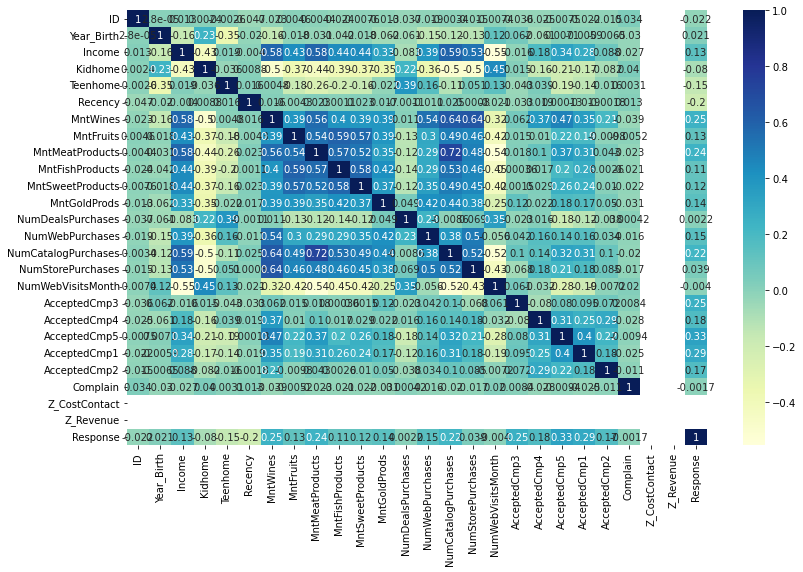

In [19]:
plt.figure(figsize=(13,8))
sns.heatmap(df.corr(),annot=True, cmap="YlGnBu")
plt.show()